In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2 
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras import Sequential
from keras.layers import Dense,Flatten,Dropout
from sklearn.metrics import accuracy_score
from keras.applications.inception_v3 import preprocess_input
from keras.layers import Conv2D, GlobalAveragePooling2D, MaxPooling2D, BatchNormalization
from keras import optimizers, regularizers
from keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from keras.models import Model
from keras import Input
from tensorflow.keras.utils import to_categorical
from keras.applications.vgg19 import VGG19
import tensorflow as tf
from keras import layers, models
from keras.models import Model
from keras import Input
image_size = 224

In [3]:
fpath = "/content/drive/MyDrive/ThucHanhANN/Felidae"
data_path = "/content/drive/MyDrive/ThucHanhANN/Felidae_Augmented"
categories = os.listdir(fpath)
print("List of categories = ",categories,"\n\nNo. of categories = ", len(categories))
num_classes = len(categories)

List of categories =  ['Lion', 'Leopard', 'Cheetah', 'Puma', 'Tiger'] 

No. of categories =  5


# Preparing Images

In [ ]:
def resize_image(img):
    img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(img)
    width, height = image.size
    if width == height:
        image = image.resize((image_size,image_size), Image.ANTIALIAS)
    else:
        if width > height:
            left = width/2 - height/2
            right = width/2 + height/2
            top = 0
            bottom = height
            image = image.crop((left,top,right,bottom))
            image = image.resize((image_size,image_size), Image.ANTIALIAS)
        else:
            left = 0
            right = width
            top = 0
            bottom = width
            image = image.crop((left,top,right,bottom))
            image = image.resize((image_size,image_size), Image.ANTIALIAS)
    numpy_image=np.array(image)  
    return numpy_image

In [4]:
def load_images_and_labels(categories):
    img_lst=[]
    labels=[]
    for index, category in enumerate(categories):
        j = 0
        for image_name in os.listdir(data_path+"/"+category):
            img = cv2.imread(data_path+"/"+category+"/"+image_name)  
            img_lst.append(np.array(img))
            labels.append(index)
            j += 1
        print("There are " , j , " images of " , categories[index].upper())     
    return img_lst, labels

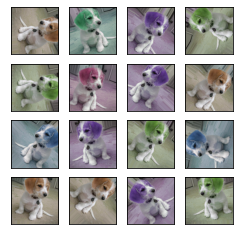

In [ ]:
img = cv2.imread('/content/drive/MyDrive/ThucHanhANN/imagesImage_18.jpg')
img = resize_image(img)
imgs = np.stack( [img for i in range(4*4)], axis=0)

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range = 90,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    horizontal_flip = True,
    preprocessing_function=lambda x: x[..., np.random.permutation([0, 1, 2])]
)

fig = plt.figure(figsize=(4, 4))
for index, image in enumerate(next(data_gen.flow(imgs)).astype(int)):
    ax = plt.subplot(4, 4, index + 1)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(image)
    # cv2.imwrite(str(index)+'.jpg', image)
plt.show()

# Data Augmentation

In [ ]:
def data_augmentation(categories, fpath, data_path):
    for index, category in enumerate(categories):
        j = 0
        os.mkdir(data_path+"/"+category)
        k = 0
        for image_name in os.listdir(fpath+"/"+category):
            
            img = cv2.imread(fpath+"/"+category+"/"+image_name)
            image_name_lst = image_name.split('.') 
            resized_img = resize_image(img)
            cv2.imwrite(data_path+"/"+category+"/"+image_name_lst[0]+"_orig"+'.jpg', resized_img)
            k += 1
            imgs = np.stack( [resized_img for i in range(4*4)], axis=0)
            for i, image in enumerate(next(data_gen.flow(imgs)).astype(int)):
                cv2.imwrite(data_path+"/"+category+"/"+image_name_lst[0]+str(i)+'.jpg', image)
                k += 1
            j += 1
        print("There are " , j , " images of " , categories[index].upper())
        print("There are " , k , " images of " , categories[index].upper(), 'after data augmentation') 
        print(' ')   

In [ ]:
data_augmentation(categories, fpath, data_path)

In [5]:
new_categories = os.listdir(data_path)
images, labels = load_images_and_labels(new_categories)
print("No. of images loaded = ",len(images),"\nNo. of labels loaded = ",len(labels))
print(type(images),type(labels))


There are  833  images of  LION
There are  850  images of  LEOPARD
There are  952  images of  CHEETAH
There are  680  images of  PUMA
There are  816  images of  TIGER
No. of images loaded =  4131 
No. of labels loaded =  4131
<class 'list'> <class 'list'>


In [6]:
x = np.array(images)
y = np.array(labels)

print("Images shape = ",x.shape,"\nLabels shape = ",y.shape)
print(type(x),type(y))

Images shape =  (4131, 224, 224, 3) 
Labels shape =  (4131,)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


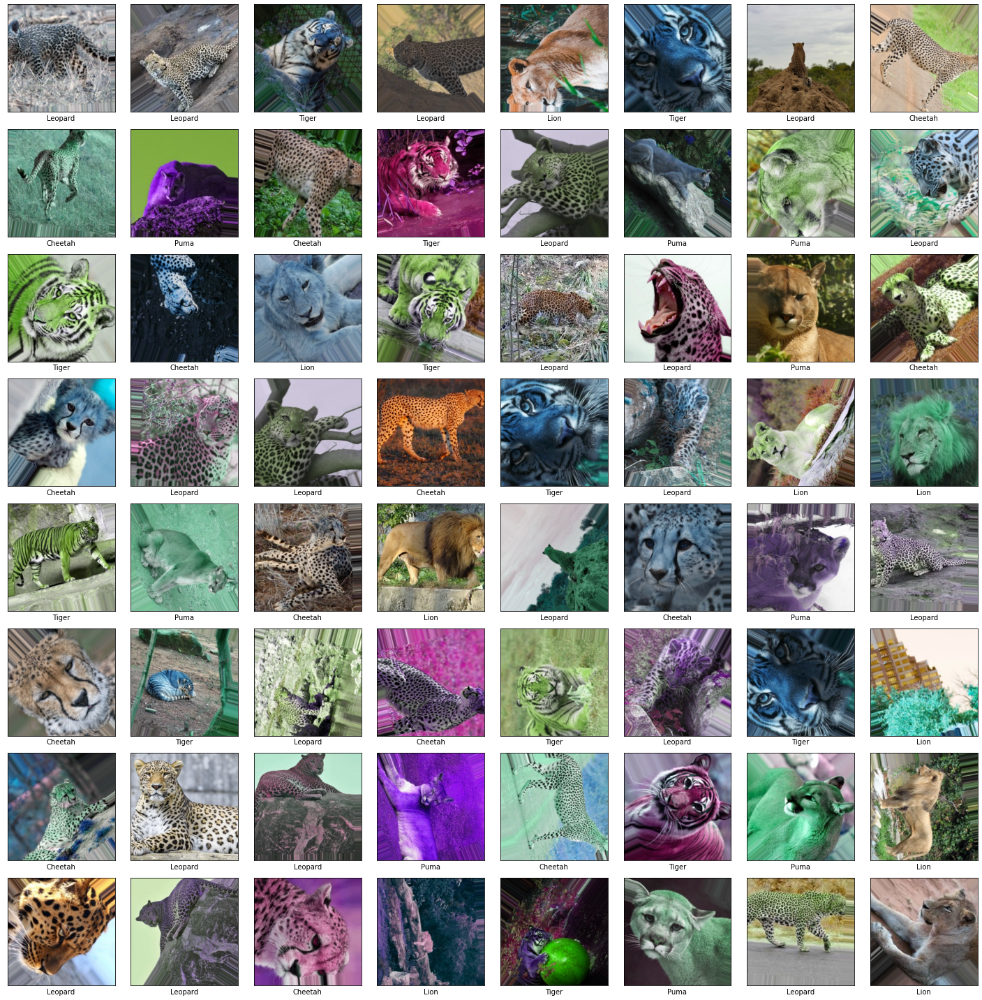

In [7]:
#Sample images
import random
ROW = 8
COLUMN = 8
plt.figure(figsize=(20, 20)) 
for i in range(ROW * COLUMN):
    temp = random.randint(0, len(images)+1)
    image = images[temp] 
    plt.subplot(ROW, COLUMN, i+1)       
    plt.imshow(image)  
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(categories[labels[temp]])
    plt.tight_layout()   
    
plt.show()

# Preparing Train, Validation & Test Data


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                   test_size = 0.2,
                                                   stratify=np.array(y), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 1) 

In [ ]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 1)

In [ ]:
print('Training Dataset Size: ', x_train.shape)
print('Validation Dataset Size: ', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)

Training Dataset Size:  (2643, 224, 224, 3)
Validation Dataset Size:  (661, 224, 224, 3)
Testing Dataset Size:  (827, 224, 224, 3)
Training Label Size:  (2643,)
Validation Label Size:  (661,)
Testing Label Size:  (827,)


In [ ]:
def plot_data(y, loc='left'):
    width = 0.37
    if loc == 'left':
        n = -0.7
    elif loc == 'right':
        n = 0.7

    unique, counts = np.unique(y, return_counts=True)
    sorted_index = np.argsort(unique)
    unique = unique[sorted_index] 
    xtemp = np.arange(len(unique))
     
    plt.bar(xtemp + n*width, counts, align='center', alpha=.7, width=width)
    plt.xticks(xtemp, unique, rotation=45)
    plt.xlabel('Felidae')
    plt.ylabel('Nums of Image')

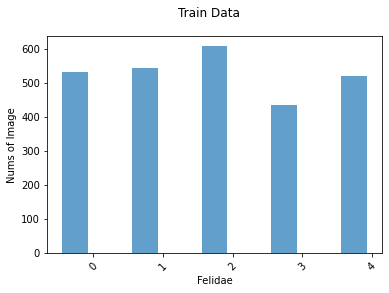

In [ ]:
plt.suptitle('Train Data')
plot_data(y_train, loc='left')

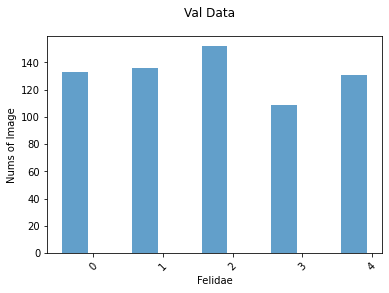

In [ ]:
plt.suptitle('Val Data')
plot_data(y_val, loc='left')

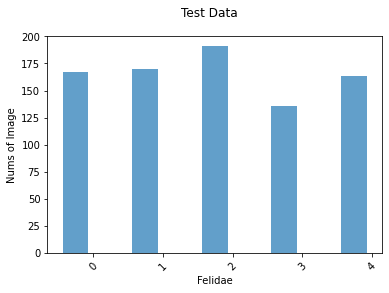

In [ ]:
plt.suptitle('Test Data')
plot_data(y_test, loc='left')

In [ ]:


from keras.preprocessing.image import ImageDataGenerator

batch_size = 64

# Create train generator
train_datagen = ImageDataGenerator(rescale=1.0/255.0,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.1,
                                    horizontal_flip=True,
                                    fill_mode='nearest'
                                  ) # CHECK

train_generator = train_datagen.flow(x_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(rescale=1.0/255.0)

val_generator = val_datagen.flow(x_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)

In [ ]:
# Label and one-hot encoding y labels
# Convert labels to one-hot encoded labels
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(y)
y_train = to_categorical(le.transform(y_train), len(categories))
y_train = np.array(y_train)
y_val = to_categorical(le.transform(y_val), len(categories))
y_val = np.array(y_val)


In [ ]:
from keras.callbacks import EarlyStopping
STOPPING_PATIENCE  = 10

In [ ]:
es = EarlyStopping(patience=STOPPING_PATIENCE, 
                   monitor='val_accuracy', 
                   mode='auto', 
                   verbose=1, 
                   restore_best_weights=True)


In [ ]:

def get_model():
    model_vgg19_conv = VGG19(weights='imagenet', include_top=False)

    # Dong bang cac layer
    for layer in model_vgg19_conv.layers:
        layer.trainable = False

    # Tao model
    input = Input(shape=(224, 224, 3), name='image_input')
    output_vgg19_conv = model_vgg19_conv(input)

    # Them cac layer FC va Dropout
    x = Flatten(name='flatten')(output_vgg19_conv)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dropout(0.5)(x)
    x = Dense(4096, activation='relu', name='fc2')(x)
    x = Dropout(0.5)(x)
    x = Dense(5, activation='softmax', name='predictions')(x)

    # Compile
    my_model = Model(inputs=input, outputs=x)
    my_model.compile(loss='sparse_categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=.0001), metrics=['accuracy'])

    return my_model

In [ ]:
model = get_model()

80150528/80134624 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_input (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, None, None, 512)   20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 fc1 (Dense)                 (None, 4096)              102764544 
                                                                 
 dropout (Dropout)           (None, 4096)              0         
                                                                 
 fc2 (Dense)                 (None, 4096)              16781312  
                                                                 
 dropout_1 (Dropout)         (None, 4096)              0     

In [ ]:
# Train Model
train_steps_per_epoch = x_train.shape[0] // batch_size
val_steps_per_epoch = x_val.shape[0] // batch_size
history = model.fit(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = 50, verbose = 1, callbacks=[es])

Epoch 1/50
41/41 [==============================] - 26s 640ms/step - loss: 0.4762 - accuracy: 0.8019 - val_loss: 0.2855 - val_accuracy: 0.8734
Epoch 2/50
41/41 [==============================] - 26s 638ms/step - loss: 0.5120 - accuracy: 0.8003 - val_loss: 0.2925 - val_accuracy: 0.8875
Epoch 3/50
41/41 [==============================] - 26s 636ms/step - loss: 0.4387 - accuracy: 0.8205 - val_loss: 0.3017 - val_accuracy: 0.8703
Epoch 4/50
41/41 [==============================] - 26s 634ms/step - loss: 0.4243 - accuracy: 0.8306 - val_loss: 0.2284 - val_accuracy: 0.9203
Epoch 5/50
41/41 [==============================] - 26s 637ms/step - loss: 0.3974 - accuracy: 0.8499 - val_loss: 0.2678 - val_accuracy: 0.8953
Epoch 6/50
41/41 [==============================] - 26s 628ms/step - loss: 0.3934 - accuracy: 0.8523 - val_loss: 0.2329 - val_accuracy: 0.9109
Epoch 7/50
41/41 [==============================] - 26s 623ms/step - loss: 0.3430 - accuracy: 0.8647 - val_loss: 0.2472 - val_accuracy: 0.9062

# Accuracy and Loss Plots

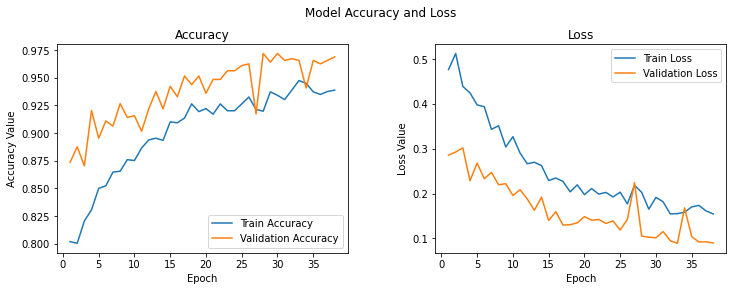

In [ ]:
epochs = 38
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Model Accuracy and Loss', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

# Predicting on Test Set

In [ ]:
# Evaluate Model on Test Data
x_test1 = x_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value

In [ ]:
x_test1.shape

(827, 224, 224, 3)

In [ ]:
y_test.shape

(827,)

In [ ]:
import seaborn as sns

In [ ]:
def plot_cf_mat(cf_matrix):
    
    classes = categories
    plt.rcParams["figure.figsize"] = (10,7)
    ax = plt.axes()
    sns.heatmap(cf_matrix, annot=True, 
              annot_kws={"size": 10}, 
              xticklabels=classes, 
              yticklabels=classes, ax = ax,fmt="d")
    ax.set_title('Confusion matrix')
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")
    plt.show()

In [ ]:
# Evaluate the model
loss, acc = model.evaluate(x_test1, y_test, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

26/26 - 4s - loss: 0.0915 - accuracy: 0.9734 - 4s/epoch - 147ms/step
Accuracy: 97.34%


In [ ]:
y_test = to_categorical(le.transform(y_test), len(categories))
y_test = np.array(y_test)

In [ ]:
test_predictions = model.predict(x_test1)
# get model predictions
predictions = np.argmax(test_predictions,axis=1)# get labels and reverse back to get the text labels
# get target labels
target_labels = np.argmax(y_test,axis=1)

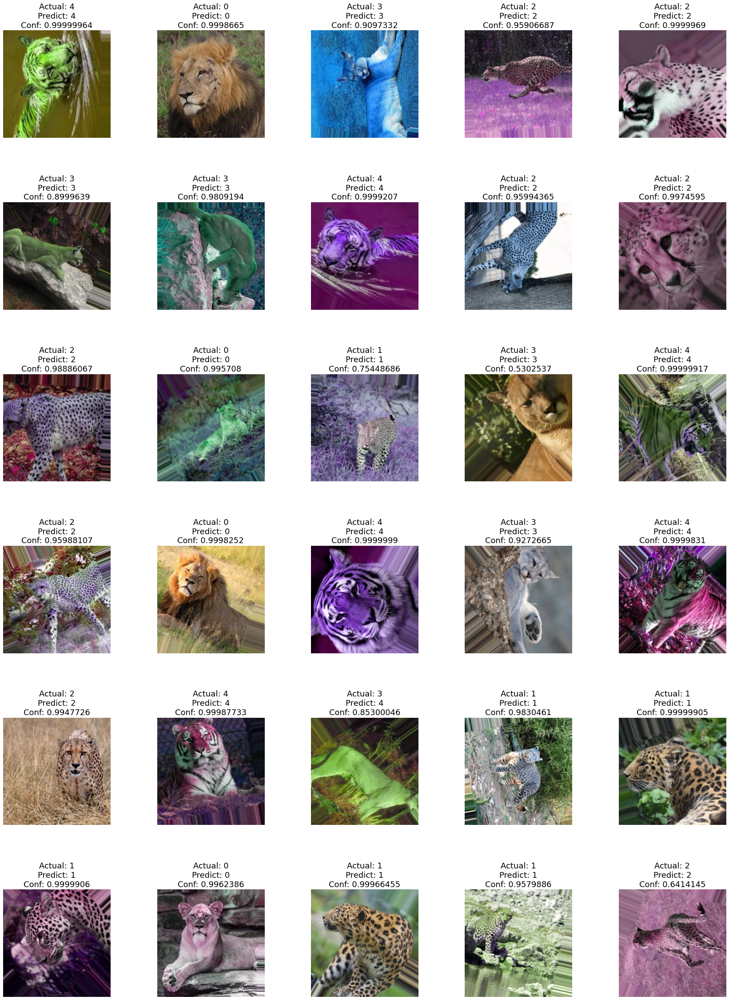

In [ ]:
# Plot Actual vs Predicted Images with Confidence Levels
import random
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()

# Model Evaluation

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score, precision_score

In [ ]:

def model_Evaluate(model):
  
    # Predict values for Test dataset
    y_pred = model.predict(x_test1)
    Y_pred = np.argmax(y_pred, axis=1)
    Y_Test = np.argmax(y_test, axis=1)
    
    class_names = categories
    print("Classification Report:") 
    # Print the evaluation metrics for the dataset.
    print(classification_report(Y_Test, Y_pred, target_names=class_names))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(Y_Test, Y_pred)
    accuracy = recall_score(Y_Test, Y_pred, average=None)
    precision=precision_score(Y_Test,Y_pred,average=None)

    print("Confusion Matrix:")
    print(cf_matrix)
    plot_cf_mat(cf_matrix)
    ## Display the visualization of the Confusion Matrix.
    plt.show()
    
    print("Accuracy for each class: ")
    
    for i in range(len(accuracy)):
        print(f"{class_names[i]}:  {format(accuracy[i]*100, '.2f')}%")
    return accuracy,precision


Classification Report:
              precision    recall  f1-score   support

        Lion       1.00      0.95      0.97       167
     Leopard       0.95      0.98      0.97       170
     Cheetah       0.98      0.96      0.97       191
        Puma       0.96      0.99      0.97       136
       Tiger       0.97      1.00      0.98       163

    accuracy                           0.97       827
   macro avg       0.97      0.97      0.97       827
weighted avg       0.97      0.97      0.97       827

Confusion Matrix:
[[158   0   2   6   1]
 [  0 167   0   0   3]
 [  0   8 183   0   0]
 [  0   0   1 134   1]
 [  0   0   0   0 163]]


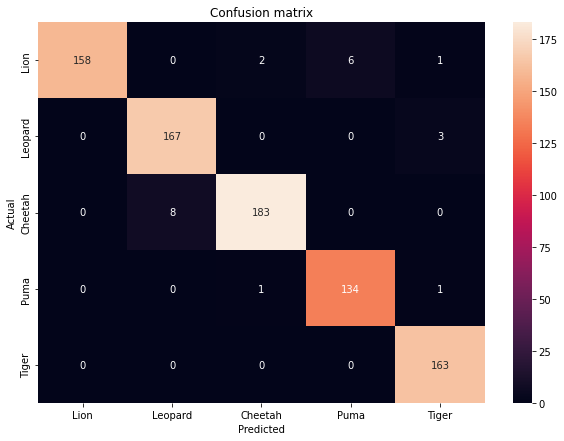

Accuracy for each class: 
Lion:  94.61%
Leopard:  98.24%
Cheetah:  95.81%
Puma:  98.53%
Tiger:  100.00%


In [ ]:
accuracy, precision = model_Evaluate(model)

# Save model

In [ ]:
model.save("/content/drive/MyDrive/ThucHanhANN/Felidae_ANN_VGG19.h5")

In [ ]:
restored_model = tf.keras.models.load_model("/content/drive/MyDrive/ThucHanhANN/Felidae_ANN_VGG19.h5")

In [ ]:
def process_and_predict(file, model):
    im = cv2.imread(file)
    im = resize_image(im)
    plt.imshow(im)
    ar = np.asarray(im)
    ar = ar.astype('float32')
    ar /= 255.0
    ar = ar.reshape(-1, 224, 224, 3)
    test_predictions = model.predict(ar)
# get model predictions
    maxnum = np.argmax(test_predictions,axis=1)
    if maxnum == 0:
        prediction = 'Lion'
    elif maxnum == 1:
        prediction = 'Leopard'
    elif maxnum == 2:
        prediction = 'Cheetah'
    elif maxnum == 3:
        prediction = 'Puma'
    elif maxnum == 4:
        prediction = 'Tiger'
    else :
        prediction = 'Not Recognize'
    return prediction

'Cheetah'

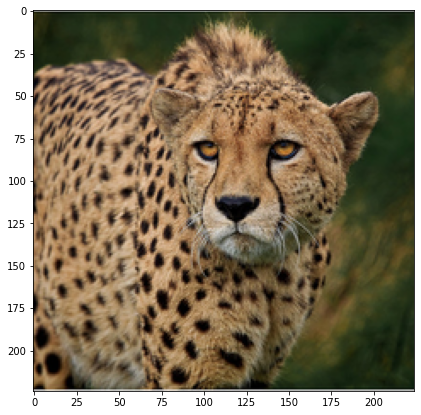

In [ ]:
process_and_predict('/content/drive/MyDrive/ThucHanhANN/test/cheetah/cheetah_test_1.jpg',model)

'Puma'

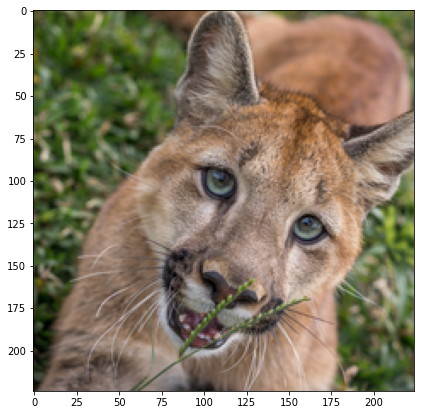

In [ ]:
process_and_predict('/content/drive/MyDrive/ThucHanhANN/test/puma/puma_test_1.jfif',model)

'Tiger'

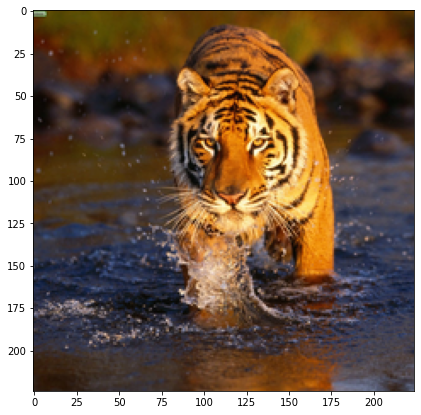

In [ ]:
process_and_predict('/content/drive/MyDrive/ThucHanhANN/test/tiger/tiger_test_1.jfif',model)

'Leopard'

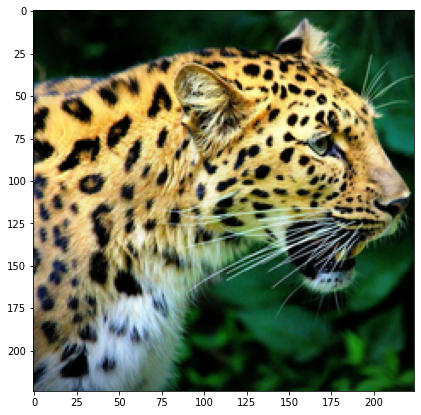

In [ ]:
process_and_predict('/content/drive/MyDrive/ThucHanhANN/test/leopard/leopard_test_1.jfif',model)